## 1 Dim RL Agent

-----


In [24]:
import numpy as np
import tensorflow as tf
assert len(tf.config.list_physical_devices('GPU')) > 0, "No GPU."

import src.components as cpts
import src.environment as envmt
import src.plot as cplt
from src.environment.wrappers import tfpy_env_wrapper

Target

In [25]:
target = cpts.FixedTarget([0, 0, 0.1])

Defining initial time and state:

In [26]:
from astropy.time import Time
time = Time("2000-01-01 00:00", scale="utc")
walker_name = "test"

walker_position = np.array([0, 0, 0])
walker_velocity = np.array([0, 0, 0])

# walker_position, walker_velocity = src.get_body_state("mars", time).values()

#### Hyperparameters and Environment
------

In [27]:
agent_type = ["DQN", "PPO"][1]
dqn_batch_size = 32
env_batch_size = 1

max_boost = 1e-4
reward_per_step = - 1.
reward_factor_boost = 0.  # 0.1 / max_boost
reward_factor_target_distance = - 10.
reward_per_step_near_target = 1.
near_target_window = 0.01
class Env(
    envmt.WalkerSystemEnv,
    envmt.OneDimDiscreteAction,               # src.env: ContinuousAction, DiscreteAction, OneDimDiscreteAction
    envmt.StateAndDiffObservation,            # src.env: StateAndDiffObservation, GravityObservation, AllPositionsObservation
    envmt.DistanceAndTargetReached            # src.env: ContinuousDistance, TargetReached, DistanceAndTargetReached
): ...

epsilon_greedy_p = 0.1 # DQN
fc_layer_params = (64, 64)
learning_rate = 1e-4

train_steps = 2000
episodes_per_train_step = 1
episodes_per_eval_step = 1

log_interval = 50

max_episode_length = 50
system_step_size = 2

if agent_type in ["PPO"]:
    replay_buffer_capacity = (
        episodes_per_train_step * 
        env_batch_size * 
        max_episode_length 
        + 10
    )
if agent_type in ["DQN"]:
    replay_buffer_capacity = 10000

In [28]:
from tf_agents.environments import ActionClipWrapper
from tf_agents.networks.actor_distribution_network import ActorDistributionNetwork
from tf_agents.networks.value_network import ValueNetwork
from tf_agents.agents import PPOAgent
from tf_agents.agents import DqnAgent
from tf_agents.networks.q_network import QNetwork
from tf_agents.metrics.tf_metrics import AverageReturnMetric
from tf_agents.replay_buffers.tf_uniform_replay_buffer import TFUniformReplayBuffer
from tf_agents.drivers.dynamic_episode_driver import DynamicEpisodeDriver
from tf_agents.utils.common import function

from keras.optimizers import Adam
from keras import layers

Batched Environment for Training

In [29]:
system = cpts.SunSystem(["earth"], initial_time=time, add_sun=False)
system.set_smooth = 1e-9
walker = cpts.Walker(walker_position, walker_velocity, mass=1., name=walker_name)
solver = cpts.Solver()

In [30]:
env = Env(
    walker, system, solver, target, 
    max_iters=max_episode_length, 
    step_size=system_step_size,
    reward_factor_boost=reward_factor_boost,
    reward_per_step=reward_per_step,
    reward_factor_target_distance=reward_factor_target_distance,
    reward_per_step_near_target=reward_per_step_near_target,
    max_boost=max_boost,
)

tf_env = tfpy_env_wrapper(env)

Easily Acessible Eval Env for evaluation:

In [31]:
print('Observation Spec:')
print(tf_env.observation_spec())

print('\nAction Spec:')
print(tf_env.action_spec())

print('\nBatch Size:')
print(tf_env.batch_size)

Observation Spec:
{'walker-state': TensorSpec(shape=(6,), dtype=tf.float32, name='walker-state'), 'diff-to-target': TensorSpec(shape=(3,), dtype=tf.float32, name='target')}

Action Spec:
BoundedTensorSpec(shape=(), dtype=tf.int32, name='boost-direction', minimum=array(0), maximum=array(2))

Batch Size:
1


#### Agent and Policies
-----

In [32]:
optimizer = Adam(learning_rate=learning_rate)

obs_specs = tf_env.observation_spec()

pre_layers = {k: layers.Flatten() for k in obs_specs}
pre_combiner = layers.Concatenate(axis=-1)

In [33]:
if agent_type == "PPO":

    actor_net = ActorDistributionNetwork(
        input_tensor_spec=obs_specs,
        output_tensor_spec=tf_env.action_spec(),
        preprocessing_layers=pre_layers,    # Must be of the same type (dict in this case) as `input_tensor_spec`
        preprocessing_combiner=pre_combiner,
        fc_layer_params=fc_layer_params
    )

    value_net = ValueNetwork(
        obs_specs,
        preprocessing_layers=pre_layers,
        preprocessing_combiner=pre_combiner,
        fc_layer_params=fc_layer_params
    )

    tf_agent = PPOAgent(
        tf_env.time_step_spec(),
        tf_env.action_spec(),
        actor_net=actor_net,
        value_net=value_net,
        optimizer=optimizer,
    )

    tf_agent.initialize()

In [34]:
if agent_type == "DQN":
    # https://www.tensorflow.org/agents/tutorials/1_dqn_tutorial
    from tf_agents.utils.common import element_wise_squared_loss
    
    q_net = QNetwork(
        input_tensor_spec=obs_specs,
        action_spec=tf_env.action_spec(),
        preprocessing_layers=pre_layers,
        preprocessing_combiner=pre_combiner,
        fc_layer_params=fc_layer_params,
    )
    
    tf_agent = DqnAgent(
        tf_env.time_step_spec(),
        tf_env.action_spec(),
        q_network=q_net,
        epsilon_greedy=epsilon_greedy_p,
        td_errors_loss_fn=element_wise_squared_loss,
        optimizer=optimizer
    )

    tf_agent.initialize()

#### Metrics
-----

In [35]:
trn_return_observer = AverageReturnMetric(batch_size=tf_env.batch_size)
evl_return_observer = AverageReturnMetric(batch_size=tf_env.batch_size)

#### Replay Buffer

-----

In [36]:
replay_buffer = TFUniformReplayBuffer(
    data_spec=tf_agent.collect_data_spec,
    batch_size=tf_env.batch_size,
    max_length=replay_buffer_capacity
)

#### Drivers

-----

In [37]:
trn_driver = DynamicEpisodeDriver(
    tf_env,
    tf_agent.collect_policy,
    observers=[replay_buffer.add_batch, trn_return_observer],
    num_episodes=episodes_per_train_step
)

evl_driver = DynamicEpisodeDriver(
    tf_env,
    tf_agent.policy,
    observers=[evl_return_observer],
    num_episodes=episodes_per_eval_step
)

#### Testing Setup

----

In [38]:
initial_time_step = tf_env.reset()
_ = evl_driver.run(initial_time_step)

initial_time_step = tf_env.reset()
for _ in range(max_episode_length):
    action = 0
    time_step = tf_env.step(action)

In [39]:
plotter = cplt.Plotter({"env": tf_env})
plotter.draw("3d", zrange=None)

In [40]:
if agent_type in ["PPO"]:
    initial_time_step = tf_env.reset()
    policy_state = tf_agent.collect_policy.get_initial_state(tf_env.batch_size)
    _, policy_state = trn_driver.run(initial_time_step, policy_state)
    # replay_buffer.gather_all()

if agent_type in ["DQN"]:
    initial_time_step = tf_env.reset()
    _, policy_state = trn_driver.run(initial_time_step)
    data = replay_buffer.as_dataset(
        num_parallel_calls=3,
        sample_batch_size=dqn_batch_size,
        num_steps=2).prefetch(3)

In [41]:
plotter = cplt.Plotter({"env": tf_env})
plotter.draw("3d", zrange=None)

In [42]:
replay_buffer.clear()

#### Training Loop
----

In [43]:
# Speeing up:
trn_driver.run = function(trn_driver.run)
evl_driver.run = function(evl_driver.run)
tf_agent.train = function(tf_agent.train)

In [44]:
from tqdm import tqdm

losses = []
rewards = []

policy_state = tf_agent.collect_policy.get_initial_state(tf_env.batch_size)

evl_returns = []
trn_returns = []
losses = []

for n_episode in tqdm(range(train_steps+1)):

    # Eval Returns (before next training step)
    initial_time_step = tf_env.reset()
    _ = evl_driver.run(initial_time_step)
    evl_return = evl_return_observer.result().numpy()
    evl_returns.append(evl_return)

    # Train Step
    initial_time_step = tf_env.reset()
    _, policy_state = trn_driver.run(initial_time_step, policy_state)

    if agent_type != "DQN":
        trajectories = replay_buffer.gather_all()
        
    if agent_type == "DQN":
        data = replay_buffer.as_dataset(
            num_parallel_calls=3,
            sample_batch_size=dqn_batch_size,
            num_steps=2).prefetch(3)
        trajectories, _ = next(iter(data))
        

    train_loss = tf_agent.train(experience=trajectories)  
    loss = train_loss.loss.numpy()
    losses.append(loss)

    # Clearing Buffer
    replay_buffer.clear()

    # Train Returns
    trn_return = trn_return_observer.result().numpy()
    trn_returns.append(trn_return)

    # Logging
    if n_episode % log_interval == 0:
        print(f"\nEposide {n_episode}:")
        print(f"- Train Average Return = {trn_return:.2f}")
        print(f"- Eval Average Return  = {evl_return:.2f}")
        print(f"- Loss                 = {loss:.2f}")

  0%|          | 0/2001 [00:00<?, ?it/s]

Instructions for updating:
Use `as_dataset(..., single_deterministic_pass=True)` instead.


  0%|          | 1/2001 [00:18<10:21:49, 18.65s/it]


Eposide 0:
- Train Average Return = 5.05
- Eval Average Return  = 6.83
- Loss                 = 4406.13


  3%|▎         | 51/2001 [01:09<33:08,  1.02s/it]  


Eposide 50:
- Train Average Return = 6.75
- Eval Average Return  = 13.22
- Loss                 = 171.74


  5%|▌         | 101/2001 [02:00<32:48,  1.04s/it]


Eposide 100:
- Train Average Return = 7.84
- Eval Average Return  = 15.45
- Loss                 = 152.28


  8%|▊         | 151/2001 [02:52<33:44,  1.09s/it]


Eposide 150:
- Train Average Return = 12.21
- Eval Average Return  = 13.45
- Loss                 = 154.69


 10%|█         | 201/2001 [03:44<30:49,  1.03s/it]


Eposide 200:
- Train Average Return = 9.63
- Eval Average Return  = 10.00
- Loss                 = 112.71


 13%|█▎        | 251/2001 [04:34<26:32,  1.10it/s]


Eposide 250:
- Train Average Return = 7.74
- Eval Average Return  = 8.22
- Loss                 = 77.34


 15%|█▌        | 301/2001 [05:24<29:28,  1.04s/it]


Eposide 300:
- Train Average Return = 7.78
- Eval Average Return  = 9.85
- Loss                 = 93.98


 18%|█▊        | 351/2001 [06:14<27:37,  1.00s/it]


Eposide 350:
- Train Average Return = 10.55
- Eval Average Return  = 9.45
- Loss                 = 250.60


 20%|██        | 401/2001 [07:04<26:48,  1.01s/it]


Eposide 400:
- Train Average Return = 8.62
- Eval Average Return  = 15.44
- Loss                 = 43.08


 23%|██▎       | 451/2001 [07:55<27:01,  1.05s/it]


Eposide 450:
- Train Average Return = 13.95
- Eval Average Return  = 9.45
- Loss                 = 51.84


 25%|██▌       | 501/2001 [08:46<25:07,  1.01s/it]


Eposide 500:
- Train Average Return = 13.60
- Eval Average Return  = 9.45
- Loss                 = 15.46


 28%|██▊       | 551/2001 [09:37<24:51,  1.03s/it]


Eposide 550:
- Train Average Return = 13.84
- Eval Average Return  = 9.45
- Loss                 = 36.82


 30%|███       | 601/2001 [10:28<23:18,  1.00it/s]


Eposide 600:
- Train Average Return = 10.60
- Eval Average Return  = 9.45
- Loss                 = 57.23


 33%|███▎      | 651/2001 [11:20<23:36,  1.05s/it]


Eposide 650:
- Train Average Return = 13.96
- Eval Average Return  = 9.45
- Loss                 = 254.53


 35%|███▌      | 701/2001 [12:11<22:03,  1.02s/it]


Eposide 700:
- Train Average Return = 13.57
- Eval Average Return  = 9.45
- Loss                 = 30.97


 38%|███▊      | 751/2001 [13:03<20:50,  1.00s/it]


Eposide 750:
- Train Average Return = 13.82
- Eval Average Return  = 9.45
- Loss                 = 25.14


 40%|████      | 801/2001 [13:54<19:32,  1.02it/s]


Eposide 800:
- Train Average Return = 12.02
- Eval Average Return  = 9.45
- Loss                 = 9.53


 43%|████▎     | 851/2001 [14:45<18:49,  1.02it/s]


Eposide 850:
- Train Average Return = 14.58
- Eval Average Return  = 9.45
- Loss                 = 3.94


 45%|████▌     | 901/2001 [15:35<17:40,  1.04it/s]


Eposide 900:
- Train Average Return = 13.37
- Eval Average Return  = 9.45
- Loss                 = 147.82


 48%|████▊     | 951/2001 [16:25<17:14,  1.02it/s]


Eposide 950:
- Train Average Return = 13.33
- Eval Average Return  = 9.45
- Loss                 = 174.13


 50%|█████     | 1001/2001 [17:17<17:05,  1.03s/it]


Eposide 1000:
- Train Average Return = 7.86
- Eval Average Return  = 9.45
- Loss                 = 61.11


 53%|█████▎    | 1051/2001 [18:09<16:10,  1.02s/it]


Eposide 1050:
- Train Average Return = 15.31
- Eval Average Return  = 21.59
- Loss                 = 942.45


 55%|█████▌    | 1101/2001 [18:59<14:26,  1.04it/s]


Eposide 1100:
- Train Average Return = 15.35
- Eval Average Return  = 15.18
- Loss                 = 33.15


 58%|█████▊    | 1151/2001 [19:49<13:58,  1.01it/s]


Eposide 1150:
- Train Average Return = 18.18
- Eval Average Return  = 18.14
- Loss                 = 227.06


 60%|██████    | 1201/2001 [20:39<12:48,  1.04it/s]


Eposide 1200:
- Train Average Return = 11.85
- Eval Average Return  = 9.45
- Loss                 = 85.67


 63%|██████▎   | 1251/2001 [21:30<13:04,  1.05s/it]


Eposide 1250:
- Train Average Return = 16.07
- Eval Average Return  = 9.45
- Loss                 = 18.16


 65%|██████▌   | 1301/2001 [22:22<12:26,  1.07s/it]


Eposide 1300:
- Train Average Return = 12.71
- Eval Average Return  = 27.27
- Loss                 = 44.05


 68%|██████▊   | 1351/2001 [23:13<10:57,  1.01s/it]


Eposide 1350:
- Train Average Return = 14.03
- Eval Average Return  = 17.30
- Loss                 = 39.81


 70%|███████   | 1401/2001 [24:03<10:13,  1.02s/it]


Eposide 1400:
- Train Average Return = 11.11
- Eval Average Return  = 10.64
- Loss                 = 157.63


 73%|███████▎  | 1451/2001 [24:54<09:12,  1.00s/it]


Eposide 1450:
- Train Average Return = 15.04
- Eval Average Return  = 26.73
- Loss                 = 12.55


 75%|███████▌  | 1501/2001 [25:43<08:08,  1.02it/s]


Eposide 1500:
- Train Average Return = 19.47
- Eval Average Return  = 9.63
- Loss                 = 917.13


 78%|███████▊  | 1551/2001 [26:35<07:49,  1.04s/it]


Eposide 1550:
- Train Average Return = 20.98
- Eval Average Return  = 11.84
- Loss                 = 29.33


 80%|████████  | 1601/2001 [27:27<06:53,  1.03s/it]


Eposide 1600:
- Train Average Return = 24.46
- Eval Average Return  = 28.35
- Loss                 = 36.19


 83%|████████▎ | 1651/2001 [28:17<05:54,  1.01s/it]


Eposide 1650:
- Train Average Return = 25.35
- Eval Average Return  = 15.33
- Loss                 = 63.57


 85%|████████▌ | 1701/2001 [29:07<05:07,  1.02s/it]


Eposide 1700:
- Train Average Return = 22.03
- Eval Average Return  = 25.64
- Loss                 = 131.01


 88%|████████▊ | 1751/2001 [29:58<04:14,  1.02s/it]


Eposide 1750:
- Train Average Return = 19.24
- Eval Average Return  = 15.33
- Loss                 = 15.45


 90%|█████████ | 1801/2001 [30:48<03:16,  1.02it/s]


Eposide 1800:
- Train Average Return = 24.65
- Eval Average Return  = 12.08
- Loss                 = 234.08


 93%|█████████▎| 1851/2001 [31:39<02:38,  1.06s/it]


Eposide 1850:
- Train Average Return = 21.80
- Eval Average Return  = 28.35
- Loss                 = 74.22


 95%|█████████▌| 1901/2001 [32:31<01:44,  1.05s/it]


Eposide 1900:
- Train Average Return = 27.71
- Eval Average Return  = 12.11
- Loss                 = 18.12


 98%|█████████▊| 1951/2001 [33:21<00:50,  1.01s/it]


Eposide 1950:
- Train Average Return = 22.33
- Eval Average Return  = 12.08
- Loss                 = 74.48


100%|██████████| 2001/2001 [34:12<00:00,  1.03s/it]


Eposide 2000:
- Train Average Return = 17.11
- Eval Average Return  = 15.77
- Loss                 = 9.10


#### Return History

----

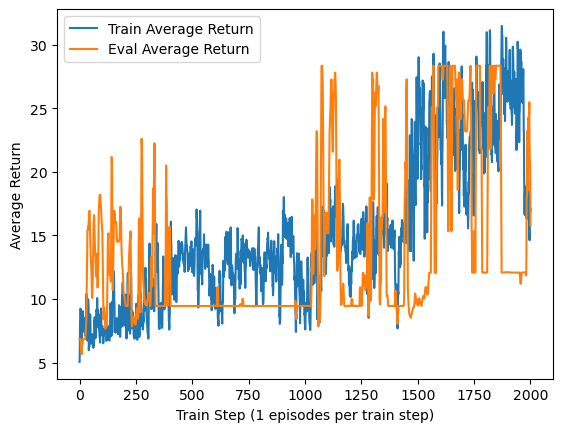

In [45]:
import matplotlib.pyplot as plt

plt.plot(trn_returns, label="Train Average Return")
plt.plot(evl_returns, label="Eval Average Return")
plt.ylabel("Average Return")
plt.xlabel(f"Train Step ({episodes_per_train_step} episodes per train step)")
plt.legend()
plt.show()

#### Visualizing Policy Execution

-----

In [46]:
time_step = tf_env.reset()
_ = evl_driver.run(time_step)

In [47]:
plotter = cplt.Plotter({"env": tf_env})
plotter.draw("3d", zrange=None)